<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Generative adversarial networks</b></h3>



В этом домашнем задании вы обучите GAN генерировать лица людей и посмотрите на то, как можно оценивать качество генерации

In [1]:
!pip install torchinfo

In [2]:
import os
import cv2
import random
from pathlib import Path
from PIL import Image, ImageDraw
import torch
import torch.nn as nn
from tqdm.notebook import tqdm
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import save_image, make_grid
from torchvision import transforms, models
from torchvision.datasets import ImageFolder
from torchinfo import summary
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from IPython.display import clear_output
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import LeaveOneOut
from sklearn.manifold import TSNE
%matplotlib inline
from google_drive_downloader import GoogleDriveDownloader as gdd
sns.set(style='darkgrid', font_scale=1.2)

In [ ]:
# фиксация SEED
SEED = 42
RANDOM_STATE = SEED
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

# Подключение Google-диска для сохранения весов
from google.colab import drive
drive.mount('/content/drive/')

GDD_DIR = Path('/content/drive/MyDrive/GAN/')
FILE_ZIP = Path('faces_dataset_small.zip')
ROOT_DIR = Path('/content/')
DATA_DIR = Path('/content/faces_dataset_small')

train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ...')
else:
    print('CUDA is available!  Training on GPU ...')

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print(f"Current device = {device}")

!nvidia-smi

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
CUDA is available!  Training on GPU ...
Current device = cuda
Tue Dec 28 17:47:21 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P0    33W / 250W |   3719MiB / 16280MiB |      0%      Default |
|                               |                      

## Часть 1. Подготовка данных (1 балл)

В качестве обучающей выборки возьмем часть датасета [Flickr Faces](https://github.com/NVlabs/ffhq-dataset), который содержит изображения лиц людей в высоком разрешении (1024х1024). Оригинальный датасет очень большой, поэтому мы возьмем его часть. Скачать датасет можно [здесь](https://drive.google.com/file/d/1KWPc4Pa7u2TWekUvNu9rTSO0U2eOlZA9/view?usp=sharing)

Давайте загрузим наши изображения. Напишите функцию, которая строит DataLoader для изображений, при этом меняя их размер до нужного значения (размер 1024 слишком большой, поэтому мы рекомендуем взять размер 128 либо немного больше)

In [ ]:
gdd.download_file_from_google_drive(file_id='1bQZo975aUvlO82YI8slXPFtQ-v7n9sLU',
                                    dest_path=ROOT_DIR / FILE_ZIP, unzip=True)

Unzipping...Done.


In [ ]:
# Статистика по датасету
image_files = sorted(list(DATA_DIR.rglob('*.png')))
print(f'Датасет содержит {len(image_files)} изображения')

Датасет содержит 3143 изображения


In [ ]:
class FacesDataset(Dataset):
    """
    Датасет с картинками, который параллельно подгружает их из папок
    производит скалирование и превращение в торчевые тензоры
    """
    def __init__(self, files, rescale_size):
        super().__init__()
        # Список файлов для загрузки
        self.files = sorted(files)
        # Размер, в который нужно преобразовать изображение
        self.rescale_size = rescale_size
        # Количество файлов
        self.len_ = len(self.files)
        # Базовые трансформации
        self.base_transforms = transforms.Compose([
            transforms.Resize(self.rescale_size),
            transforms.CenterCrop(self.rescale_size),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),  # Нормализуем -1 ... 1
        ])    
        # Соберём датасет с применением трансформаций в тензор
        self.dataset = torch.empty(size=(self.len_, 3, self.rescale_size, self.rescale_size))
        for i, image_path in enumerate(self.files):
            image = Image.open(image_path)
            self.dataset[i] = self.base_transforms(image)
                     
    def __len__(self):
        return self.len_
      
    def __getitem__(self, index):
        # Преобразования изображений и перевод их в тензоры PyTorch
        transform = transforms.Compose([transforms.RandomHorizontalFlip(p=0.5)])     
        x = self.dataset[index]
        x = transform(x)
        return x

In [11]:
import argparse

parser = argparse.ArgumentParser()
parser.add_argument("--n_epochs",    type=int,   default=400,    help="number of epochs of training")
parser.add_argument("--batch_size",  type=int,   default=128,    help="size of the batches")
parser.add_argument("--lr",          type=float, default=1e-4,   help="adam: base learning rate")
parser.add_argument("--b1",          type=float, default=0.5,    help="adam: decay of first order momentum of gradient")
parser.add_argument("--b2",          type=float, default=0.999,  help="adam: decay of first order momentum of gradient")
parser.add_argument("--workers",     type=int,   default=2,      help="number of cpu threads to use during batch generation")
parser.add_argument("--nz",          type=int,   default=128,    help="size of latent vector z; output of generator")
parser.add_argument("--nc",          type=int,   default=3,      help="number of image channels")
parser.add_argument("--ngf",         type=int,   default=64,     help="size of feature maps in generator")
parser.add_argument("--ndf",         type=int,   default=64,     help="size of features maps in discriminator")
parser.add_argument("--kernel_size", type=int,   default=4,      help="size of the convolving kernel")
parser.add_argument("--image_size",  type=int,   default=128,    help="size of each image dimension")
parser.add_argument("--batchNorm_momentum", type=float, default=0.1, help="the value used for the running_mean and running_var computation")
args, unknown = parser.parse_known_args()
print(args)

Namespace(b1=0.5, b2=0.999, batchNorm_momentum=0.1, batch_size=128, image_size=128, kernel_size=4, lr=0.0001, n_epochs=400, nc=3, ndf=64, ngf=64, nz=128, workers=2)


In [ ]:
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)                                # Средние и стандартные отклонения
dataset = FacesDataset(image_files, rescale_size=args.image_size)       # Создадим датасет
data_loader = DataLoader(dataset, pin_memory=False, batch_size=args.batch_size, shuffle=True, 
                         num_workers=args.workers)                       # Создадим даталоадер

In [ ]:
def denorm(img_tensors):
    '''Функция для нормализации от (-1 ... 1) к (0 ... 1)'''
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=32):
    '''Функция для отрисовки изображений в сетке'''
    fig, ax = plt.subplots(figsize=(12, 24))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))
    plt.title('')

def show_batch(dl, nmax=32):
    '''Функция для извлечения изображений из батча даталоадера'''
    for images in dl:
        show_images(images, nmax)
        break

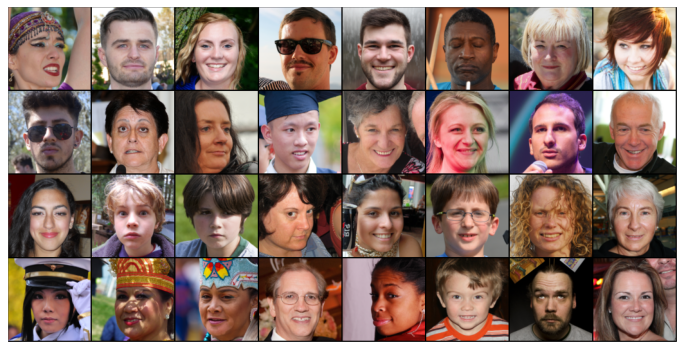

In [ ]:
show_batch(data_loader)  # Визуализируем изображения из батча

## Часть 2. Построение и обучение модели (2 балла)

Сконструируйте генератор и дискриминатор. Помните, что:
* дискриминатор принимает на вход изображение (тензор размера `3 x image_size x image_size`) и выдает вероятность того, что изображение настоящее (тензор размера 1)

* генератор принимает на вход тензор шумов размера `latent_size x 1 x 1` и генерирует изображение размера `3 x image_size x image_size`

In [5]:
class GaussianNoise(nn.Module): 
    '''Добавляет Гауссов шум'''
    def __init__(self, std=0.3):
        super().__init__()
        self.std = std

    def forward(self, x):
        if self.training:
            return x + torch.empty_like(x).normal_(std=self.std)
        else:
            return x

In [6]:
def weights_init(m):
    '''Функция для инициализации весов'''
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [12]:
class Generator(nn.Module):
  def __init__(self):
    super(Generator, self).__init__()
    self.nz = args.nz
    
    self.main = nn.Sequential(
        # input Z; First
        nn.ConvTranspose2d(in_channels=args.nz, out_channels=args.ngf * 16, kernel_size=args.kernel_size, stride=1, padding=0, bias=False),
        nn.BatchNorm2d(num_features=args.ngf*16, momentum = args.batchNorm_momentum),
        nn.LeakyReLU(0.2, inplace=True),

        #second
        nn.ConvTranspose2d(in_channels=args.ngf * 16, out_channels=args.ngf * 8, kernel_size=args.kernel_size, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(num_features=args.ngf*8, momentum = args.batchNorm_momentum),
        nn.LeakyReLU(0.2, inplace=True),
        
        #third
        nn.ConvTranspose2d(in_channels=args.ngf*8, out_channels=args.ngf*4, kernel_size=args.kernel_size, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(num_features=args.ngf*4, momentum = args.batchNorm_momentum),
        nn.LeakyReLU(0.2, inplace=True),
        
        # fourth
        nn.ConvTranspose2d(in_channels=args.ngf * 4, out_channels=args.ngf*2, kernel_size=args.kernel_size, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(num_features=args.ngf*2, momentum = args.batchNorm_momentum),
        nn.LeakyReLU(0.2, inplace=True),

        # fifth
        nn.ConvTranspose2d(in_channels=args.ngf*2, out_channels=args.ngf, kernel_size=args.kernel_size, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(num_features=args.ngf, momentum = args.batchNorm_momentum),
        nn.LeakyReLU(0.2, inplace=True),

        # output nc * 64 * 64
        nn.ConvTranspose2d(in_channels=args.ngf, out_channels=args.nc, kernel_size=args.kernel_size, stride=2, padding=1, bias=False),
        nn.Tanh()
    )
    
  def forward(self, input):
    return self.main(input)

In [13]:
from torchinfo import summary
summary(Generator().to('cpu').apply(weights_init), (args.batch_size, Generator().nz, 1, 1))

Layer (type:depth-idx)                   Output Shape              Param #
Generator                                --                        --
├─Sequential: 1-1                        [128, 3, 128, 128]        --
│    └─ConvTranspose2d: 2-1              [128, 1024, 4, 4]         2,097,152
│    └─BatchNorm2d: 2-2                  [128, 1024, 4, 4]         2,048
│    └─LeakyReLU: 2-3                    [128, 1024, 4, 4]         --
│    └─ConvTranspose2d: 2-4              [128, 512, 8, 8]          8,388,608
│    └─BatchNorm2d: 2-5                  [128, 512, 8, 8]          1,024
│    └─LeakyReLU: 2-6                    [128, 512, 8, 8]          --
│    └─ConvTranspose2d: 2-7              [128, 256, 16, 16]        2,097,152
│    └─BatchNorm2d: 2-8                  [128, 256, 16, 16]        512
│    └─LeakyReLU: 2-9                    [128, 256, 16, 16]        --
│    └─ConvTranspose2d: 2-10             [128, 128, 32, 32]        524,288
│    └─BatchNorm2d: 2-11                 [128, 128, 

In [14]:
class Discriminator(nn.Module):
  def __init__(self, std=0.1):
    super(Discriminator, self).__init__()
    self.std = std

    self.main = nn.Sequential(
        # input
        GaussianNoise(self.std),
        nn.Conv2d(in_channels=args.nc, out_channels=args.ndf, kernel_size=args.kernel_size, stride=2, padding=1, bias=False),
        nn.LeakyReLU(0.2, inplace=True),
        
        # second 
        GaussianNoise(self.std),
        nn.Conv2d(in_channels=args.ndf, out_channels=args.ndf * 2, kernel_size=args.kernel_size, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(num_features=args.ndf *2, momentum = args.batchNorm_momentum),
        nn.LeakyReLU(0.2, inplace=True),
        
        # third
        GaussianNoise(self.std),
        nn.Conv2d(in_channels=args.ndf * 2, out_channels=args.ndf * 4, kernel_size=args.kernel_size, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(num_features=args.ndf * 4, momentum = args.batchNorm_momentum),
        nn.LeakyReLU(0.2, inplace=True),
        
        # fourth
        GaussianNoise(self.std),
        nn.Conv2d(in_channels=args.ndf * 4, out_channels=args.ndf * 8, kernel_size=args.kernel_size, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(num_features=args.ndf * 8, momentum = args.batchNorm_momentum),
        nn.LeakyReLU(0.2, inplace=True),

        # fifth
        GaussianNoise(self.std),
        nn.Conv2d(in_channels=args.ndf * 8, out_channels=args.ndf * 16, kernel_size=args.kernel_size, stride=2, padding=1, bias=False),
        nn.BatchNorm2d(num_features=args.ndf * 16, momentum = args.batchNorm_momentum),
        nn.LeakyReLU(0.2, inplace=True),
        
        # output
        GaussianNoise(self.std),
        nn.Conv2d(in_channels=args.ndf * 16, out_channels=1, kernel_size=args.kernel_size, stride=1, padding=0, bias=False),
        nn.Flatten(),
        nn.Sigmoid()
    )

  def forward(self, input):
    return self.main(input)

In [15]:
from torchinfo import summary
summary(Discriminator().to('cpu').apply(weights_init), (args.batch_size, args.nc, args.image_size, args.image_size))

Layer (type:depth-idx)                   Output Shape              Param #
Discriminator                            --                        --
├─Sequential: 1-1                        [128, 1]                  --
│    └─GaussianNoise: 2-1                [128, 3, 128, 128]        --
│    └─Conv2d: 2-2                       [128, 64, 64, 64]         3,072
│    └─LeakyReLU: 2-3                    [128, 64, 64, 64]         --
│    └─GaussianNoise: 2-4                [128, 64, 64, 64]         --
│    └─Conv2d: 2-5                       [128, 128, 32, 32]        131,072
│    └─BatchNorm2d: 2-6                  [128, 128, 32, 32]        256
│    └─LeakyReLU: 2-7                    [128, 128, 32, 32]        --
│    └─GaussianNoise: 2-8                [128, 128, 32, 32]        --
│    └─Conv2d: 2-9                       [128, 256, 16, 16]        524,288
│    └─BatchNorm2d: 2-10                 [128, 256, 16, 16]        512
│    └─LeakyReLU: 2-11                   [128, 256, 16, 16]        --


Посмотрим, как выглядит шум, из которого будут генерироваться изображения


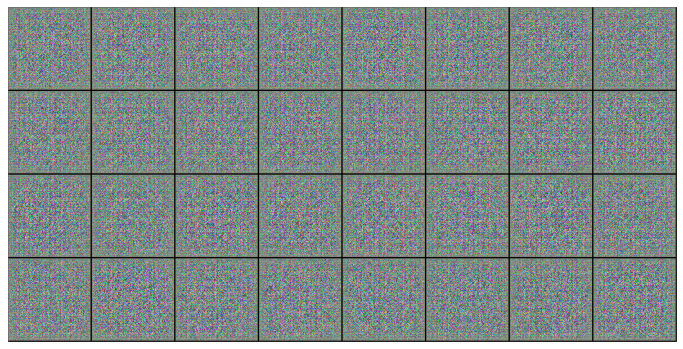

In [ ]:
xb = torch.randn(args.batch_size, args.nz, 1, 1) 
fake_images = Generator()(xb)
show_images(fake_images)

In [ ]:
# Класс и функция для переноса изображений даталоадера на device
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
data_loader = DeviceDataLoader(data_loader, device)  # Перенесём изображения даталоадера на device

In [ ]:
sample_dir = 'generated'  # Создадим папку для сохранения сгенерированных изображений
os.makedirs(sample_dir, exist_ok=True)

Перейдем теперь к обучению нашего GANа. Алгоритм обучения следующий:
1. Учим дискриминатор:
  * берем реальные изображения и присваиваем им метку 1
  * генерируем изображения генератором и присваиваем им метку 0
  * обучаем классификатор на два класса

2. Учим генератор:
  * генерируем изображения генератором и присваиваем им метку 0
  * предсказываем дискриминаторором, реальное это изображение или нет


В качестве функции потерь берем бинарную кросс-энтропию

In [ ]:
# Определим модели
model = {
    "discriminator": Discriminator().to(device).apply(weights_init),
    "generator": Generator().to(device).apply(weights_init)
}

# Определим Loss функции для двух моделей
criterion = {
    "discriminator": nn.BCELoss(),
    "generator": nn.BCELoss()
}

# Определим оптимизаторы для двух моделей + TTUR
optimizer = {
    "discriminator": torch.optim.AdamW(model["discriminator"].parameters(), 
                                      lr=args.lr, betas=(args.b1, args.b2),
                                      eps=1e-8, weight_decay=1e-5, amsgrad=False),
    "generator": torch.optim.AdamW(model["generator"].parameters(),
                                  lr=args.lr*4, betas=(args.b1,args.b2),
                                  eps=1e-8, weight_decay=1e-5, amsgrad=False)
    }

In [ ]:
def save_samples(model, index, latent_tensors, show=True):
    '''Функция для сохранения в директорию изображений созданных
    генератором с возможностью их визуализации'''
    fake_images = model(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname);
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(denorm(fake_images.cpu().detach()), nrow=8).permute(1, 2, 0))

In [ ]:
def fit(model, criterion, epochs, optimizer, start_idx=1):
    # Переведём модели в режим обучения
    model["discriminator"].train()
    model["generator"].train()
    # Очистим кеш
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    schedulerD = torch.optim.lr_scheduler.MultiStepLR(optimizer["discriminator"], milestones=[epochs//4,epochs//2,epochs//1.4,epochs//1.1], gamma=0.8)
    schedulerG = torch.optim.lr_scheduler.MultiStepLR(optimizer["generator"], milestones=[epochs//4,epochs//2,epochs//1.4,epochs//1.1], gamma=0.8)

    for epoch in range(epochs):
        loss_d_per_epoch = []
        loss_g_per_epoch = []
        real_score_per_epoch = []
        fake_score_per_epoch = []
        for real_images in tqdm(data_loader):
            # Train discriminator
            # Clear discriminator gradients
            optimizer["discriminator"].zero_grad()
            # Pass real images through discriminator
            real_preds = model["discriminator"](real_images)
            real_targets = 0.1 * torch.rand(real_images.size(0), 1, device=device) + 0.9 # вероятность от 0.9 до 1. LabelSmoothing
            real_loss = criterion["discriminator"](real_preds, real_targets)
            cur_real_score = torch.mean(real_preds).item()
            
            # Generate fake images
            latent = torch.randn(args.batch_size, model["generator"].nz, 1, 1, device=device)
            fake_images = model["generator"](latent)
            # Pass fake images through discriminator
            fake_targets = 0.1 * torch.rand(fake_images.size(0), 1, device=device)  # вероятность от 0 до 0.1. LabelSmoothing
            fake_preds = model["discriminator"](fake_images)
            fake_loss = criterion["discriminator"](fake_preds, fake_targets)
            cur_fake_score = torch.mean(fake_preds).item()

            real_score_per_epoch.append(cur_real_score)
            fake_score_per_epoch.append(cur_fake_score)

            # Update discriminator weights
            loss_d = real_loss + fake_loss
            loss_d.backward()
            optimizer["discriminator"].step()
            loss_d_per_epoch.append(loss_d.item())


            # Train generator
            # Clear generator gradients
            optimizer["generator"].zero_grad()
            
            # Generate fake images
            latent = torch.randn(args.batch_size, model["generator"].nz, 1, 1, device=device)
            fake_images = model["generator"](latent)
            
            # Try to fool the discriminator
            preds = model["discriminator"](fake_images)
            targets = torch.ones(args.batch_size, 1, device=device)
            loss_g = criterion["generator"](preds, targets)
            
            # Update generator weights
            loss_g.backward()
            optimizer["generator"].step()
            loss_g_per_epoch.append(loss_g.item())
   
        # Record losses & scores
        losses_g.append(np.mean(loss_g_per_epoch))
        losses_d.append(np.mean(loss_d_per_epoch))
        real_scores.append(np.mean(real_score_per_epoch))
        fake_scores.append(np.mean(fake_score_per_epoch))
        
        schedulerD.step()
        schedulerG.step()

        # Visualisations
        clear_output(wait=True)
    
        fig = plt.figure(figsize=(10, 5))
        fig.suptitle(("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(epoch+1, epochs, losses_g[-1], losses_d[-1], real_scores[-1], fake_scores[-1])))

        gs1 = GridSpec(2, 5, left=0.0001, right=0.95, wspace=0.05)
        
        ax1 = fig.add_subplot(gs1[:-1, :1])
        ax1.imshow(denorm(fake_images[0].detach().cpu().permute(1,2,0)))
        ax1.axis('off') 
        ax2 = fig.add_subplot(gs1[:-1, 1])
        ax2.imshow(denorm(fake_images[1].detach().cpu().permute(1,2,0)))
        ax2.axis('off') 
        ax3 = fig.add_subplot(gs1[:-1, 2])
        ax3.imshow(denorm(fake_images[2].detach().cpu().permute(1,2,0)))
        ax3.axis('off') 
        ax4 = fig.add_subplot(gs1[:-1, 3])
        ax4.imshow(denorm(fake_images[3].detach().cpu().permute(1,2,0)))
        ax4.axis('off') 
        ax5 = fig.add_subplot(gs1[:-1, -1])
        ax5.imshow(denorm(fake_images[4].detach().cpu().permute(1,2,0)))
        ax5.axis('off') 
        ax6 = fig.add_subplot(gs1[-1, :1])
        ax6.imshow(denorm(fake_images[5].detach().cpu().permute(1,2,0)))
        ax6.axis('off') 
        ax7 = fig.add_subplot(gs1[-1, 1])
        ax7.imshow(denorm(fake_images[6].detach().cpu().permute(1,2,0)))
        ax7.axis('off')
        ax8 = fig.add_subplot(gs1[-1, 2])
        ax8.imshow(denorm(fake_images[7].detach().cpu().permute(1,2,0)))
        ax8.axis('off')
        ax9 = fig.add_subplot(gs1[-1, 3])
        ax9.imshow(denorm(fake_images[8].detach().cpu().permute(1,2,0)))
        ax9.axis('off')
        ax10 = fig.add_subplot(gs1[-1, 4])
        ax10.imshow(denorm(fake_images[9].detach().cpu().permute(1,2,0)))
        ax10.axis('off')

        gs2 = GridSpec(2, 2, left=1.01, right=2.0, hspace=0.05)
        
        ax11 = fig.add_subplot(gs2[:, :-1])
        ax11.plot(np.arange(len(losses_g)), losses_g, label='Generator')
        ax11.plot(np.arange(len(losses_d)), losses_d, label='Discriminator')
        ax11.set_ylim(0, max(losses_g+losses_g)+0.5)
        ax11.set_xlabel('Epoch')
        ax11.set_title('Losses')
        ax11.legend()

        plt.show()
    
        # Save generated images (last epoch)
        if epoch == epochs - 1:
            # Cоздадим фиксированный латентный вектор для генерации изображений
            fixed_latent = torch.randn(args.batch_size, model["generator"].nz, 1, 1, device=device)
            save_samples(model["generator"], epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

Постройте графики лосса для генератора и дискриминатора. Что вы можете сказать про эти графики?

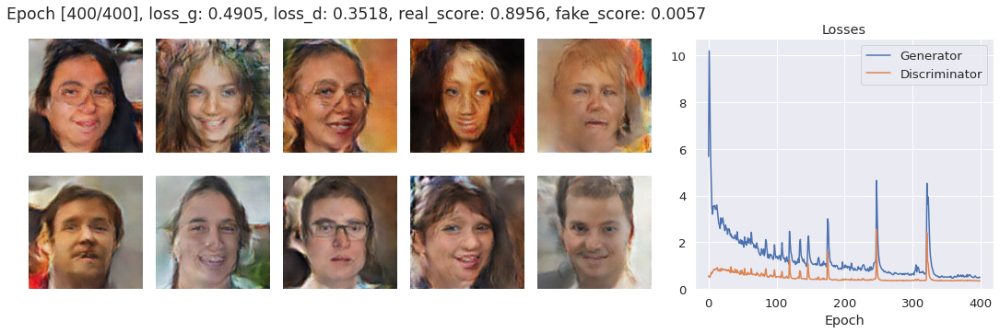

Saving generated-images-0400.png


In [ ]:
history = fit(model, criterion, args.n_epochs, optimizer)

Значения лосс-функции генератора больше значений дискриминатора, в процессе обучения значения генератора стремятся приблизиться к значениям дискриминатора. Лосс-функция дискриминатора гораздо стабильнее на всем протяжении обучении.

In [ ]:
# Сохраним значения loss и score в переменные
losses_g, losses_d, real_scores, fake_scores = history

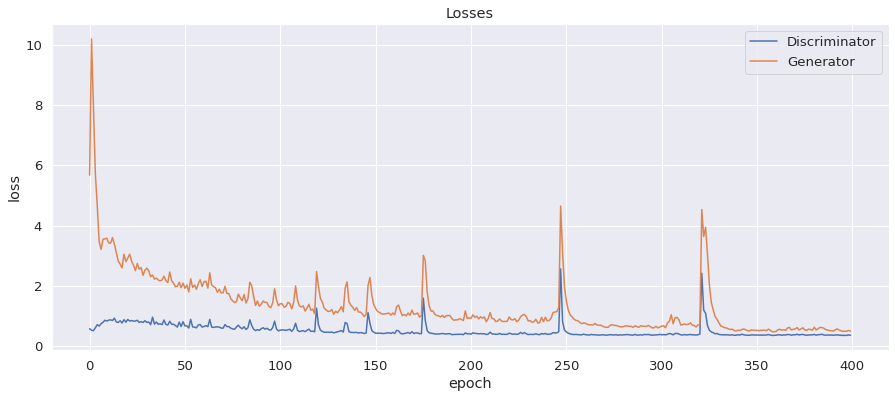

In [ ]:
# Построим графики лоссов
plt.figure(figsize=(15, 6))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

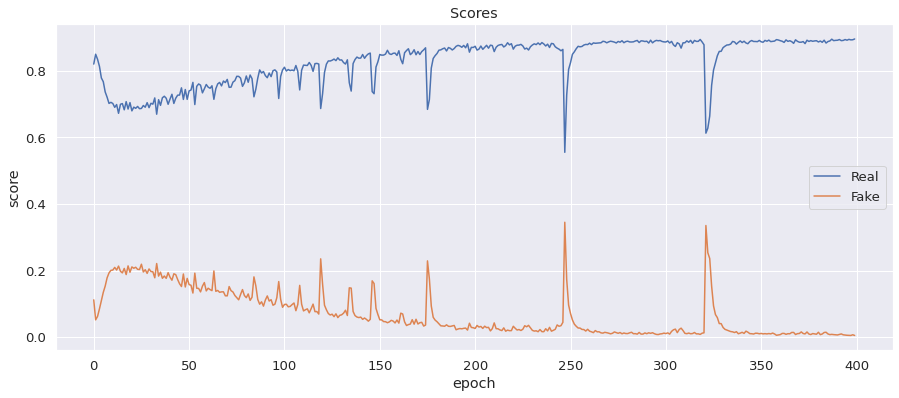

In [ ]:
# Построим графики скоров
plt.figure(figsize=(15, 6))
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

In [ ]:
# Save Generator
torch.save(model["generator"].state_dict(), Path(str(GDD_DIR) + str('/generator.pt')))

# Save Discriminator
torch.save(model["discriminator"].state_dict(), Path(str(GDD_DIR) + str('/discriminator.pt')))

In [ ]:
# Загрузка весов
model = {
    "discriminator": Discriminator().to(device).apply(weights_init),
    "generator": Generator().to(device).apply(weights_init)
}

# Load Discriminator
model["discriminator"].load_state_dict(torch.load(Path(str(GDD_DIR) + str('/discriminator.pt')), map_location=torch.device('cuda')))
model["discriminator"].eval()

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (12): BatchNorm2d(1024, eps=1e-05

In [ ]:
# Load Generator
model["generator"].load_state_dict(torch.load(Path(str(GDD_DIR) + str('/generator.pt')), map_location=torch.device('cuda')))
model["generator"].eval()

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(256, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): ConvTrans

## Часть 3. Генерация изображений (1 балл)

Теперь давайте оценим качество получившихся изображений. Напишите функцию, которая выводит изображения, сгенерированные нашим генератором

In [ ]:
n_images = 72                                                                              # Количество генерируемых изображений
fixed_latent = torch.randn(n_images, model["generator"].nz, 1, 1, device=device)           # Создадим латентный вектор
fake_images = model["generator"](fixed_latent)                                             # Сгенерируем изображения

In [ ]:
def show_images(fake_images):
    '''Функция для визуализации изображений созданных генератором'''
    fig, ax = plt.subplots(figsize=(20, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(fake_images.cpu().detach()), nrow=12).permute(1, 2, 0))

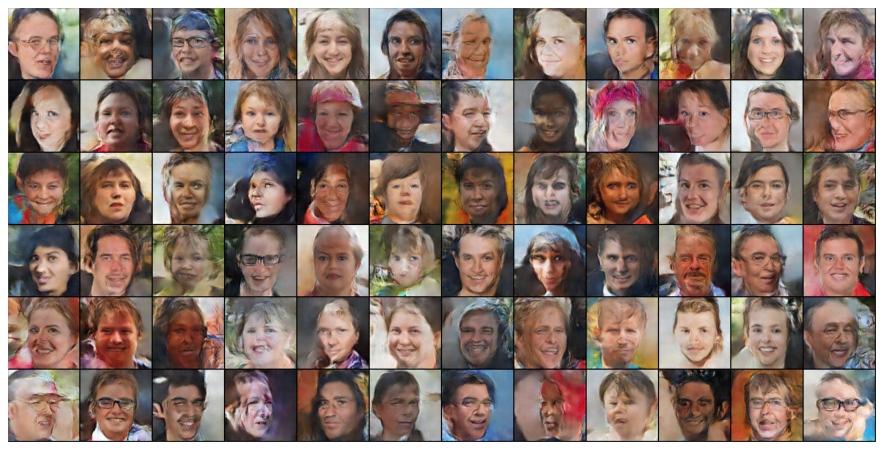

In [ ]:
show_images(fake_images)  # Визуализируем сгенерированные изображения

Как вам качество получившихся изображений?

### Генерация фейковых лиц достаточно близка к реальным лицам, не смотря на то, что скорее всего в их жизни сейчас не самый лучший период. Некоторые лица примерно схожи, однако, полных копий нет. Детали лица (глаза, губы, нос, зубы и даже очки) прорисованы достаточно точно. Модель пытается обработать и фон, но он получается хуже лиц.

## Часть 4. Leave-one-out-1-NN classifier accuracy (6 баллов)

### 4.1. Подсчет accuracy (4 балла)

Не всегда бывает удобно оценивать качество сгенерированных картинок глазами. В качестве альтернативы вам предлагается реализовать следующий подход:
  * Сгенерировать столько же фейковых изображений, сколько есть настоящих в обучающей выборке. Присвоить фейковым метку класса 0, настоящим – 1.
  * Построить leave-one-out оценку: обучить 1NN Classifier (`sklearn.neighbors.KNeighborsClassifier(n_neighbors=1)`) предсказывать класс на всех объектах, кроме одного, проверить качество (accuracy) на оставшемся объекте. В этом вам поможет `sklearn.model_selection.LeaveOneOut`

In [ ]:
# Подготовка реальных изображений и их меток класса
real_images_all = torch.FloatTensor()
iterator = iter(data_loader)
for i in tqdm(range(len(data_loader))):
    real_images_all = torch.cat((real_images_all, next(iterator).cpu()))
real_ones = torch.ones(dataset.len_, 1, device=device)  # Метки класса 1

# Подготовка фейковых изображений и их меток класса
model["generator"].eval()
with torch.no_grad():
    fake_images_all = model["generator"](torch.randn(dataset.len_, args.nz, 1, 1, device=device))
fake_zero = torch.zeros(dataset.len_, 1, device=device) # Метки класса 0

assert(real_images_all.shape[0] == fake_images_all.shape[0]), 'Проверьте на равенство количество реальных и фейковых изображений'

  0%|          | 0/25 [00:00<?, ?it/s]

In [ ]:
real_with_fake_images = torch.cat((real_images_all.to('cpu'), fake_images_all.to('cpu')))
n_img = real_with_fake_images.shape[0]
real_with_fake_images = real_with_fake_images.reshape(n_img,-1).numpy() #создадим плоский вектор
real_with_fake_labels = torch.cat((real_ones.to('cpu'), fake_zero.to('cpu'))).numpy().ravel()

In [ ]:
# Обучение KNN-классификатора. Требуемое время около 3-х часов в GoogleColab.
clf = KNeighborsClassifier(n_neighbors=1, n_jobs=-1)
loo = LeaveOneOut()
accuracy_list = []
classes_list = []
for train_index, test_index in loo.split(real_with_fake_images):
    X_train, X_test = real_with_fake_images[train_index], real_with_fake_images[test_index]
    y_train, y_test = real_with_fake_labels[train_index], real_with_fake_labels[test_index]
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_list.append(accuracy)
    classes_list.append(y_test)

In [ ]:
# Точность предсказаний по классам
df = pd.DataFrame()
df['accuracy'] = accuracy_list
df['accuracy'] = df['accuracy'].astype('int32')
df['classes'] = classes_list
df['classes'] = df['classes'].astype('int32')
df.pivot_table(values='accuracy', index='classes', aggfunc='mean')

,accuracy
classes,
0,0.950048
1,0.271397


In [ ]:
# Общая точность 1NN
round(df['accuracy'].mean(),2)

0.61

Что вы можете сказать о получившемся результате? Какой accuracy мы хотели бы получить и почему?

#### Почти все фейковые изображения, которые мы генерируем моделью из рандомного шума, распознаются как фейковые. Что также подтверждается их визуализацией. Однако, реальные фото в бОльшей своей части также распознаются как фейковые, что говорит о том, что сгенерированные изображения не так уж и плохо получились. При этом, идеальная accuracy равна 0.5 (фейки невозможно отличить от реальных фото). Полученное мною значение accuracy 0.61 достаточно близко к 0.5, что в условиях ограниченности вычислительных ресурсов и простоты модели обученной нейронной сети (конечно, это не MSGAN и не StyleGan_v.3 ;) ) говорит о правильности выбранной архитектуры и примененных "триксов", таких как: различные Learning_Rate для генератора и дискриминатора (TTUR), шумовая аугментация реальных изображений, LabelSmoothing, 400 обучающих эпох и т.п.

### 4.2. Визуализация распределений (2 балла)

Давайте посмотрим на то, насколько похожи распределения настоящих и фейковых изображений. Для этого воспользуйтесь методом, снижающим размерность (к примеру, TSNE) и изобразите на графике разным цветом точки, соответствующие реальным и сгенерированным изображенияи

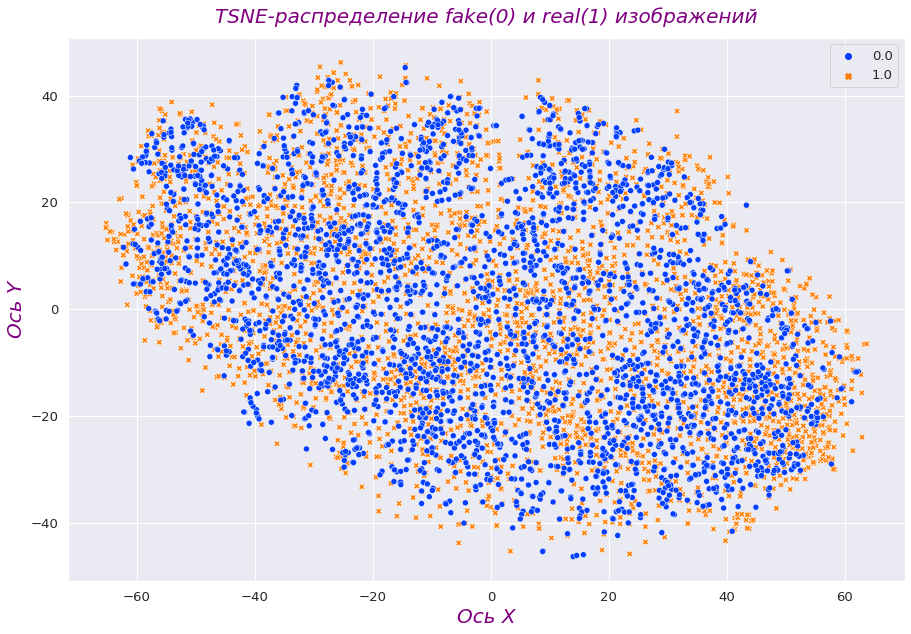

In [ ]:
import warnings
warnings.filterwarnings("ignore")

real_with_fake_images_tsne = TSNE(n_components=2).fit_transform(real_with_fake_images)

fig, ax = plt.subplots()
sns.set(rc={'figure.figsize': (15, 10)}, font_scale=1.2, style='darkgrid')
sns.scatterplot(x = real_with_fake_images_tsne[:, 0], y = real_with_fake_images_tsne[:, 1], hue=real_with_fake_labels, palette='bright', style=real_with_fake_labels)
ax.set_title('TSNE-распределение fake(0) и real(1) изображений', fontsize =20, color = 'purple', fontfamily = 'sans-serif', fontstyle = 'italic', pad = 15)
ax.set_xlabel('Ось X', fontsize =20, color = 'purple', fontfamily = 'sans-serif', fontstyle = 'italic')
ax.set_ylabel('Ось Y', fontsize =20, color = 'purple', fontfamily = 'sans-serif', fontstyle = 'italic')
plt.show()

Прокомментируйте получившийся результат:

Равномерное и перемешанное распределение классов фейковых и реальных изображений говорит об их высоком уровне схожести, что является для нас главной целью - научиться генерировать изображения, которые невозможно было бы отличить от реальных. И мы почти добились этого. Полученное TSNE-распределение не позволяет однозначно и четко кластеризовать разные классы друг относительно друга.

### И посмотрим на результаты генерации изображений по датасету с 70к изображениями через 100 эпох (image_size 128x128, latent_size (nz) 128, batch_size 128, LR_G 4e-4, LR_D 1e-4). Обучение занимает около 1100 минут. В этом случае мы получаем гораздо лучшие результаты, однако, время обучения модели очень большое, а дальнейшие возможности обработки результатов в Colab сильно ограничены из-за доступного размера ОЗУ.

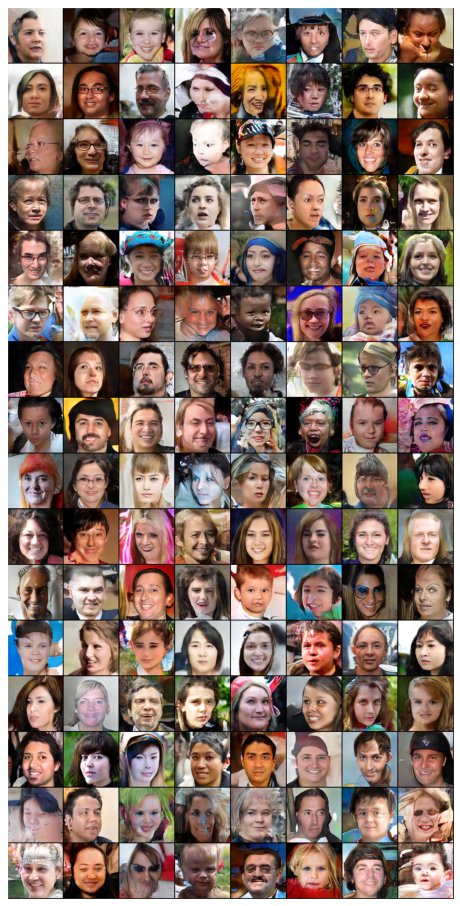

In [26]:
import matplotlib.image as mpimg
plt.figure(figsize=(8,30))
image_path = str(GDD_DIR) + str('/generated-images-0100.png')
img = mpimg.imread(image_path)
plt.imshow(img, cmap=plt.cm.gray)
plt.grid(False)
plt.xticks([])
plt.yticks([])
plt.show()

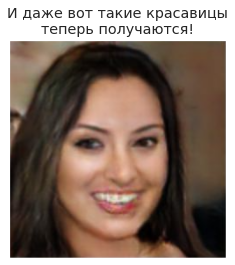

In [31]:
image_path = str(GDD_DIR) + str('/fake_foto.png')
img = mpimg.imread(image_path)
plt.imshow(img, cmap=plt.cm.gray)
plt.title('И даже вот такие красавицы\nтеперь получаются!')
plt.grid(False)
plt.xticks([])
plt.yticks([])
plt.show()

# К О Н Е Ц ! ! !